# Assignment 2

Natural Language Processing

UE15CS333

Nitish J Makam

01FB15ECS197

6th Semester D Section

PESU 2019 Batch

In [1]:
#Importing the necessary packages
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from pandas.tools.plotting import scatter_matrix
import seaborn as sns

#Reading the csv file and importing it into a dataframe
pk=pd.read_csv('parkinsons_updrs.csv')
#Statistical information about the various variables
pk.describe()

,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
count,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,...,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000
mean,21.494128,64.804936,0.317787,92.863722,21.296229,29.018942,0.006154,0.000044,0.002987,0.003277,...,0.310960,0.017156,0.020144,0.027481,0.051467,0.032120,21.679495,0.541473,0.653240,0.219589
std,12.372279,8.821524,0.465656,53.445602,8.129282,10.700283,0.005624,0.000036,0.003124,0.003732,...,0.230254,0.013237,0.016664,0.019986,0.039711,0.059692,4.291096,0.100986,0.070902,0.091498
min,1.000000,36.000000,0.000000,-4.262500,5.037700,7.000000,0.000830,0.000002,0.000330,0.000430,...,0.026000,0.001610,0.001940,0.002490,0.004840,0.000286,1.659000,0.151020,0.514040,0.021983
25%,10.000000,58.000000,0.000000,46.847500,15.000000,21.371000,0.003580,0.000022,0.001580,0.001820,...,0.175000,0.009280,0.010790,0.015665,0.027830,0.010955,19.406000,0.469785,0.596180,0.156340
50%,22.000000,65.000000,0.000000,91.523000,20.871000,27.576000,0.004900,0.000035,0.002250,0.002490,...,0.253000,0.013700,0.015940,0.022710,0.041110,0.018448,21.920000,0.542250,0.643600,0.205500
75%,33.000000,72.000000,1.000000,138.445000,27.596500,36.399000,0.006800,0.000053,0.003290,0.003460,...,0.365000,0.020575,0.023755,0.032715,0.061735,0.031463,24.444000,0.614045,0.711335,0.264490
max,42.000000,85.000000,1.000000,215.490000,39.511000,54.992000,0.099990,0.000446,0.057540,0.069560,...,2.107000,0.162670,0.167020,0.275460,0.488020,0.748260,37.875000,0.966080,0.865600,0.731730


In [2]:
#Dropping the column motor_UPDRS
pk=pk.drop('motor_UPDRS',axis=1)

/usr/lib/python3/dist-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


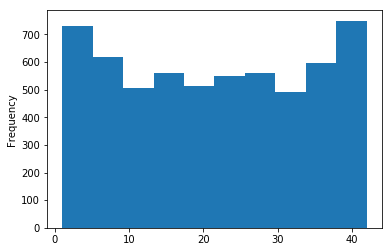

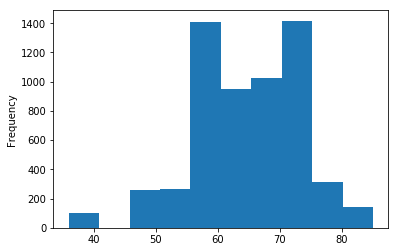

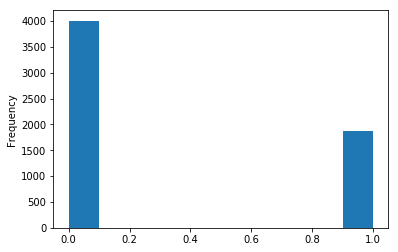

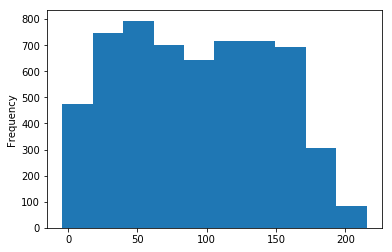

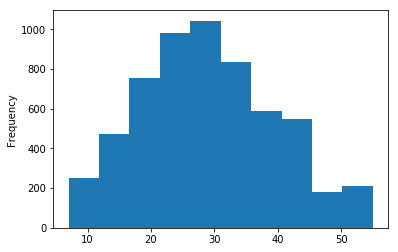

...

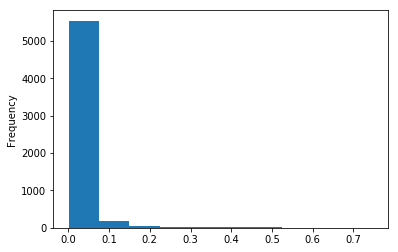

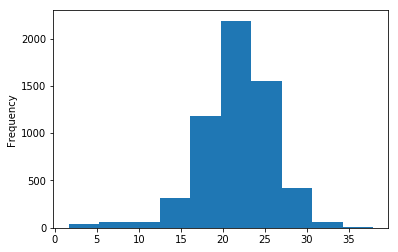

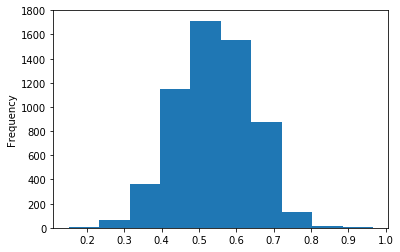

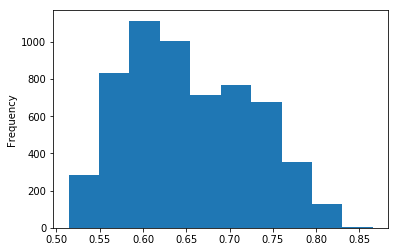

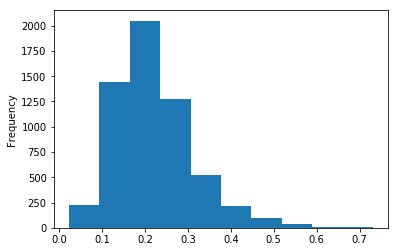

In [3]:
#Plotting histograms for each variable in the dataframe
for i in list(pk):
    plt.figure()
    pk[i].plot.hist()

/usr/lib/python3/dist-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


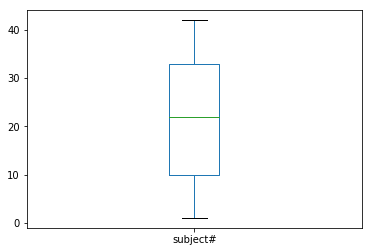

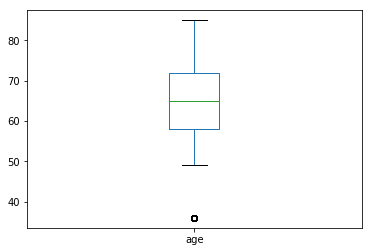

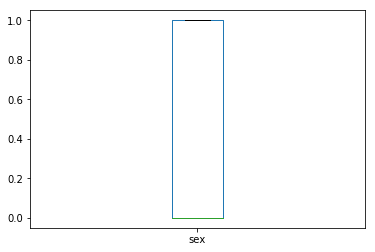

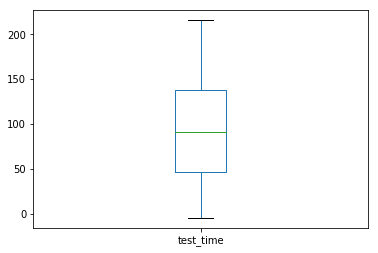

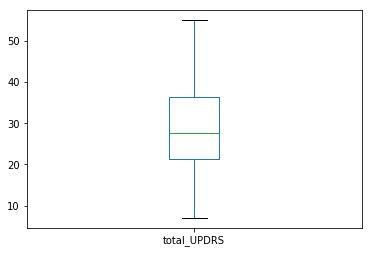

...

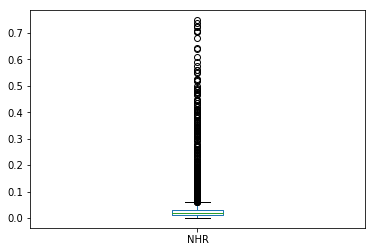

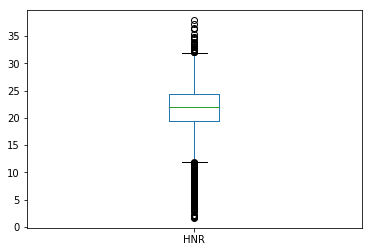

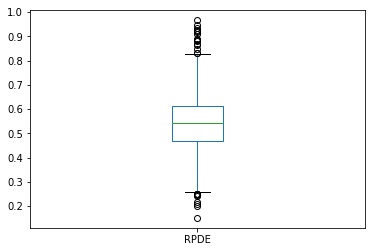

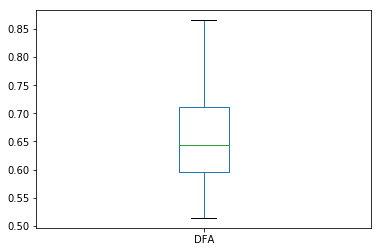

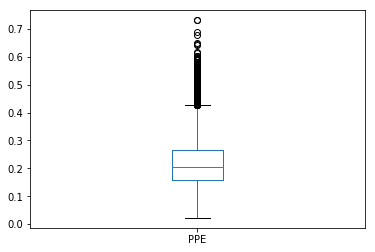

In [4]:
#PLotting boxplots for each variable in the dataframe
for i in list(pk):
    plt.figure()
    pk[i].plot.box()

## Boxplot Insights for each Variable

1. Subject# is symmetric.
2. Age also looks symmetric.
3. Sex is symmetric.
4. test_time is symmetric.
5. total_UPDRS also looks symmetric and also normally distributed.
6. jitter(%) is positively skewed.
7. jitter(Abs) is positively skewed.
8. jitter RAP is positively skewed.
9. jitter PPQ5 is positively skewed.
10. jitter DDP is positively skewed.
11. Shimmer is positively skewed.
12. Shimmer(dB) is positively skewed.
13. Shimmer APQ3 is positively skewed.
14. Shimmer APQ5 is positively skewed.
15. Shimmer APQ11 is positively skewed.
16. Shimmer DDA is positively skewed.
17. NHR is positively skewed.
18. HNR is symmetric.
19. RPDE is symmetric.
20. DFA is symmetric.
21. PPE is positively skewed.

In [5]:
#Applying log using numpy for the skewed variables
skewed_var=['Jitter(%)','Jitter(Abs)','Jitter:RAP','Jitter:PPQ5','Jitter:DDP','Shimmer','Shimmer(dB)','Shimmer:APQ3','Shimmer:APQ5','Shimmer:APQ11','Shimmer:DDA','NHR','PPE']
for i in skewed_var:
    pk[i]=np.log10(pk[i])

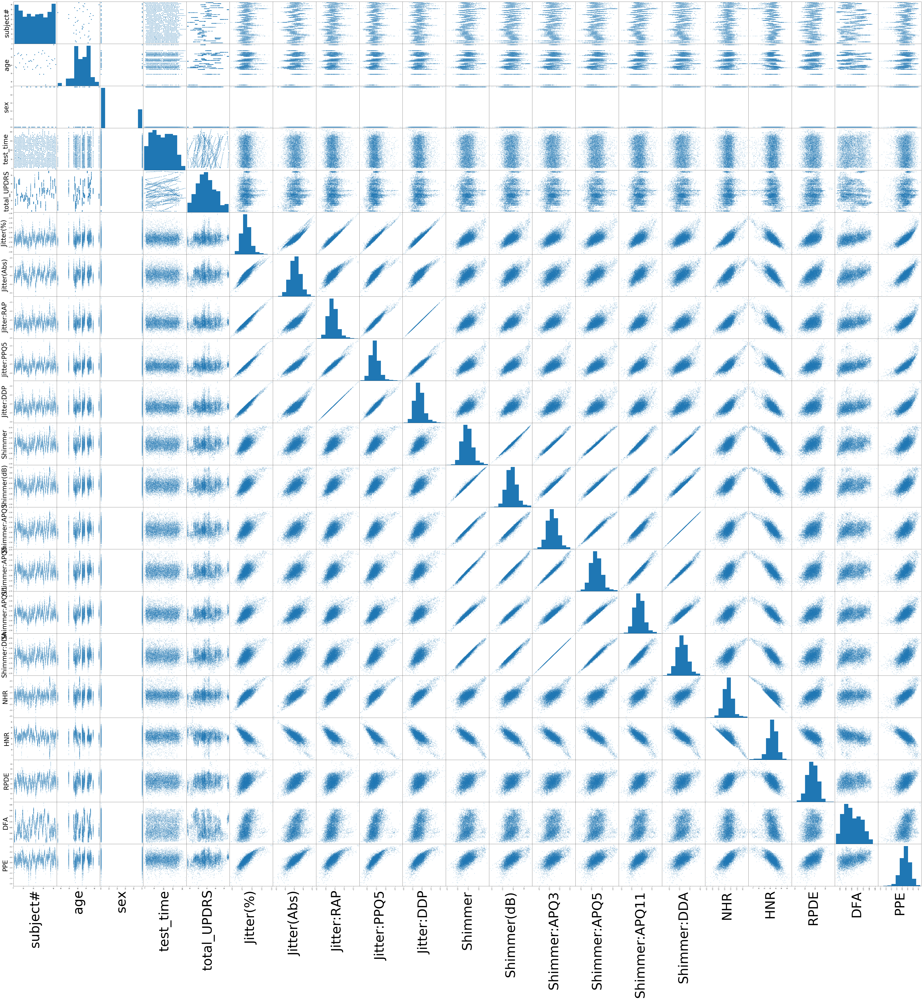

In [6]:
#Plotting scatter matrix
sm=scatter_matrix(pk,alpha=0.2,figsize=(100,100))

for ax in sm.ravel():
    ax.set_xlabel(ax.get_xlabel(), fontsize = 80, rotation = 90)
    ax.set_ylabel(ax.get_ylabel(), fontsize = 40, rotation = 90)
plt.savefig('ScatterMatrix')

Few variables such as Jitter and it's various variants look largely correlated and also variables like Shimmer and its variants look largely correlated.


The possible pairs are -
1. Jitter(DDP) and Jitter(RAP) appear to be directly proportional. Positive correlation.
2. Jitter(RAP) and Jitter(%) appear to be directly proportional. Positive correlation.
3. Shimmer APQ3 and Shimmer DDA appear to be directly proportional. Positive correlation.
4. HNR and Shimmer appear to be inversely proportional. Negative correlation.
5. HNR and Jitter(RAP) appear to be inversely proportional. Negative correlation.
6. PPE and HNR appear to be inversely proportional. Negative correlation.
7. Shimmer and all it's variants appear to have a large positive correlation.
8. Jitter and it's variants appear to have a large positive correlation.

The possible independent variables for multiple regression are -
1. Age
2. Sex
3. test_time
4. Jitter(RAP)
5. Shimmer
6. RPDE
7. HNR
8. DFA
9. PPE
